Q1)

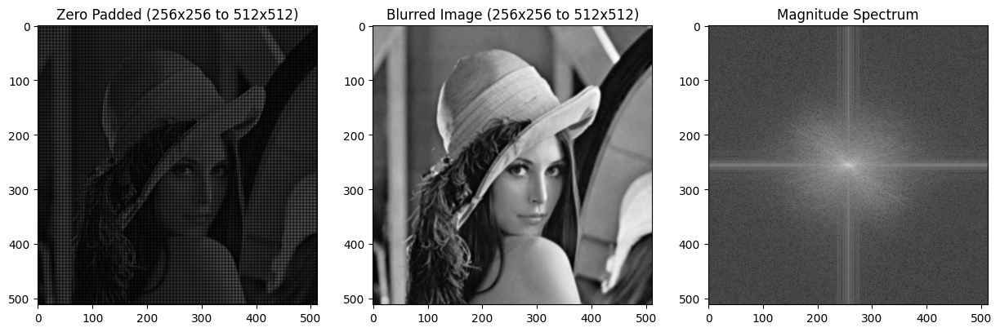

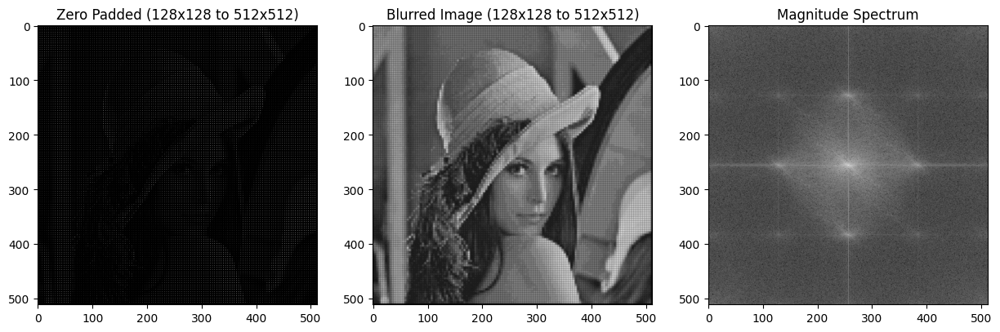

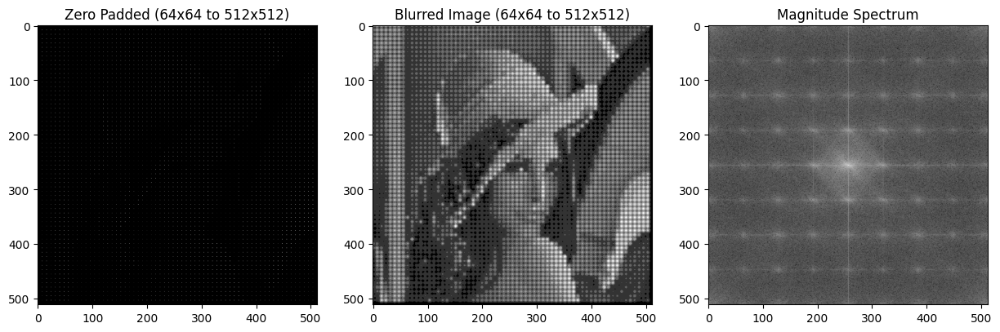

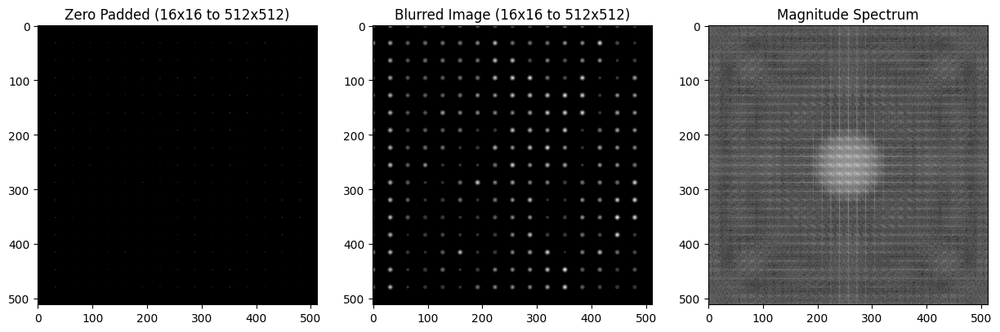

PSNR values before blurring -  [8.097298445801032, 7.1285686544810645, 6.9184597228797085, 6.857117313929312]
PSNR values after blurring -  [9.336664495669961, 7.40437388259534, 6.986054124075159, 6.860242642354573]
SSIM values before blurring -  [0.036803017473768206, 0.013645546177837252, 0.006272801252645258, 0.0009709183359360138]
SSIM values after blurring -  [0.3309435335004712, 0.07419380513737939, 0.019348668856062536, 0.0016071036550726703]
PSNR values using cv2 -  [33.47327450971525, 28.876409620220812, 24.819458470309055, 18.307381508519597]
SSIM values using cv2 -  [0.9234831104049375, 0.838987822370254, 0.7194107088034244, 0.5456271888983697]


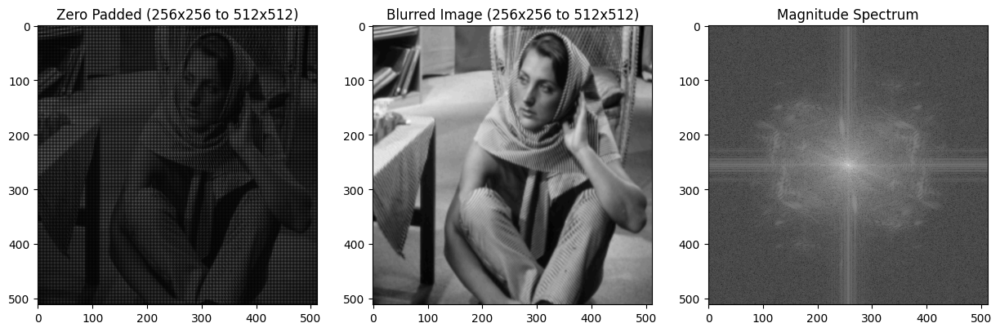

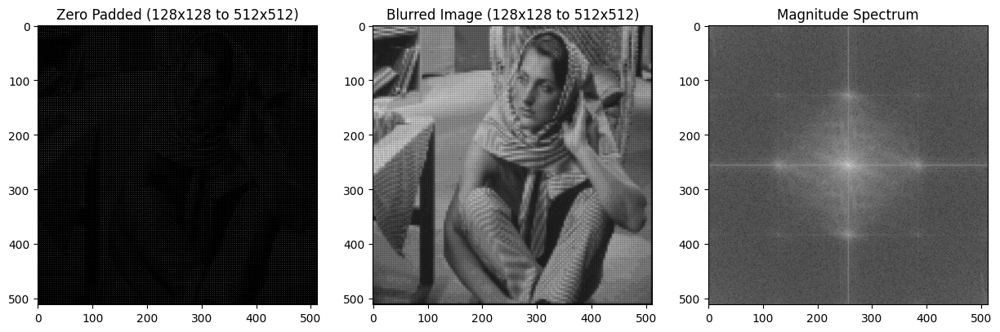

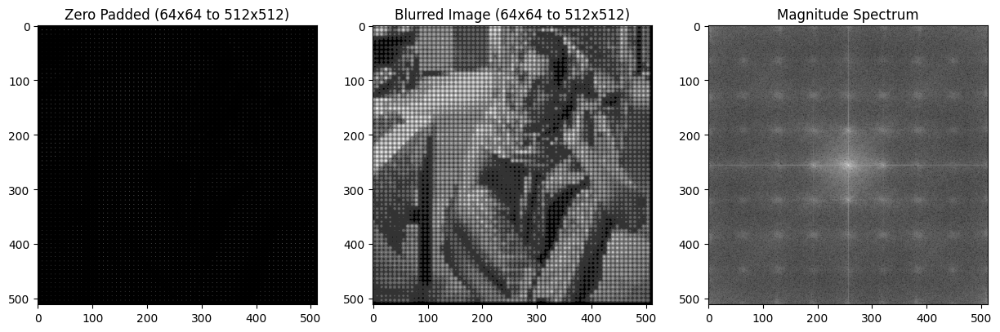

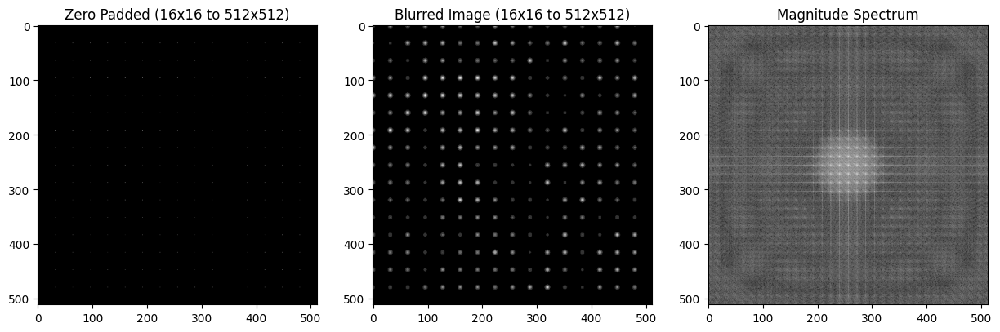

PSNR values before blurring -  [7.63767280829636, 6.67714978295669, 6.471044778538029, 6.410227259265873]
PSNR values after blurring -  [8.848961800286078, 6.949628628115635, 6.53695155233193, 6.412982725901523]
SSIM values before blurring -  [0.035013509472167914, 0.01147296841769529, 0.005114618381856869, 0.0008012980849300235]
SSIM values after blurring -  [0.2539634907863732, 0.05455641173527578, 0.014094289164455999, 0.0012856577084697975]
PSNR values using cv2 -  [25.187938189156434, 23.345125498216692, 21.842365516490112, 17.622021349713158]
SSIM values using cv2 -  [0.7787706100504503, 0.6677415620458402, 0.5628397915921574, 0.40641565238185134]


In [96]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from skimage import color, img_as_ubyte
from skimage.metrics import structural_similarity as ssim

before_blur_PSNR = []
after_blur_PSNR = []
before_blur_SSIM = []
after_blur_SSIM = []
cv2_PSNR = []
cv2_SSIM = []

def func1(a, b, matrix):
    upscale_matrix = []
    for i in range(a):
        l = []
        for j in range(b):
            if j % 2 == 0:
                l.append(matrix[i][j // 2])
            else:
                l.append(0)
        upscale_matrix.append(l)
    return upscale_matrix

def func2(a, matrix):
    l = [0] * a
    final_matrix = []
    for i in range(a):
        if i % 2 == 0:
            final_matrix.append(matrix[i // 2])
        else:
            final_matrix.append(l)
    return final_matrix

def calculate_ssim(image1, image2):
    if image1.shape[-1] == 3:
        image1 = color.rgb2gray(image1)
    if image2.shape[-1] == 3:
        image2 = color.rgb2gray(image2)
    image1 = img_as_ubyte(image1)
    image2 = img_as_ubyte(image2)
    ssim_index = ssim(image1, image2, full=True)[0]
    return ssim_index

def compute_fft(image):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image
    fft = np.fft.fft2(gray)
    magnitude_spectrum = np.fft.fftshift(np.log(np.abs(fft) + 1))
    return magnitude_spectrum

def display_images(original, matrix, a, b):
    before_blur_PSNR.append(cv2.PSNR(matrix, original))
    before_blur_SSIM.append(calculate_ssim(matrix, original))
    final_blurred = cv2.GaussianBlur(matrix, (b, b), 0)
    after_blur_PSNR.append(cv2.PSNR(final_blurred, original))
    after_blur_SSIM.append(calculate_ssim(final_blurred, original))
    magnitude_spectrum = compute_fft(final_blurred)
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(matrix, cv2.COLOR_BGR2RGB))
    plt.title(f'Zero Padded ({a}x{a} to 512x512)')
    plt.subplot(1, 3, 2)
    plt.imshow(final_blurred, cmap='gray')
    plt.title(f'Blurred Image ({a}x{a} to 512x512)')
    plt.subplot(1, 3, 3)
    plt.imshow(magnitude_spectrum, cmap='gray')
    plt.title('Magnitude Spectrum')
    plt.show()

def process_image(image_path):
    original_image = cv2.imread(image_path)
    original_gray = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
    resized_256_image = cv2.resize(original_image, (256, 256))
    resized_128_image = cv2.resize(original_image, (128, 128))
    resized_64_image = cv2.resize(original_image, (64, 64))
    resized_16_image = cv2.resize(original_image, (16, 16))

    resized_256_512 = cv2.resize(resized_256_image, (512, 512))
    resized_128_512 = cv2.resize(resized_128_image, (512, 512))
    resized_64_512 = cv2.resize(resized_64_image, (512, 512))
    resized_16_512 = cv2.resize(resized_16_image, (512, 512))

    resized_256_512 = cv2.cvtColor(resized_256_512, cv2.COLOR_BGR2GRAY)
    resized_128_512 = cv2.cvtColor(resized_128_512, cv2.COLOR_BGR2GRAY)
    resized_64_512 = cv2.cvtColor(resized_64_512, cv2.COLOR_BGR2GRAY)
    resized_16_512 = cv2.cvtColor(resized_16_512, cv2.COLOR_BGR2GRAY)

    cv2_PSNR.append(cv2.PSNR(original_gray,resized_256_512))
    cv2_PSNR.append(cv2.PSNR(original_gray,resized_128_512))
    cv2_PSNR.append(cv2.PSNR(original_gray,resized_64_512))
    cv2_PSNR.append(cv2.PSNR(original_gray,resized_16_512))

    cv2_SSIM.append(calculate_ssim(original_gray,resized_256_512))
    cv2_SSIM.append(calculate_ssim(original_gray,resized_128_512))
    cv2_SSIM.append(calculate_ssim(original_gray,resized_64_512))
    cv2_SSIM.append(calculate_ssim(original_gray,resized_16_512))

    gray_256 = cv2.cvtColor(resized_256_image, cv2.COLOR_BGR2GRAY)
    gray_128 = cv2.cvtColor(resized_128_image, cv2.COLOR_BGR2GRAY)
    gray_64 = cv2.cvtColor(resized_64_image, cv2.COLOR_BGR2GRAY)
    gray_16 = cv2.cvtColor(resized_16_image, cv2.COLOR_BGR2GRAY)

    matrix_256 = np.array(gray_256)
    matrix_128 = np.array(gray_128)
    matrix_64 = np.array(gray_64)
    matrix_16 = np.array(gray_16)

    # 256*256 to 512*512
    upscale_256_matrix = func1(256, 512, matrix_256)
    final_256_matrix = func2(512, upscale_256_matrix)
    final_256_matrix = np.array(final_256_matrix, dtype=np.uint8)
    display_images(original_gray,final_256_matrix, 256, 5)

    # 128*128 to 256*256 and then to 512*512
    upscale = func1(128, 256, matrix_128)
    final = func2(256, upscale)
    upscale = func1(256, 512, final)
    final_1 = func2(512, upscale)
    final_matrix = np.array(final_1, dtype=np.uint8)
    display_images(original_gray,final_matrix, 128, 7)

    # 64*64 to 128*128 to 256*256 to 512*512
    upscale = func1(64, 128, matrix_64)
    final = func2(128, upscale)
    upscale = func1(128, 256, final)
    final = func2(256, upscale)
    upscale = func1(256, 512, final)
    final = func2(512, upscale)
    final_matrix = np.array(final, dtype=np.uint8)
    display_images(original_gray,final_matrix, 64, 15)

    # 16*16 to 32*32 to 64*64 to 256*256 to 128*128
    upscale = func1(16, 32, matrix_16)
    final = func2(32, upscale)
    upscale = func1(32, 64, final)
    final = func2(64, upscale)
    upscale = func1(64, 128, final)
    final = func2(128, upscale)
    upscale = func1(128, 256, final)
    final = func2(256, upscale)
    upscale = func1(256, 512, final)
    final = func2(512, upscale)
    final_matrix = np.array(final, dtype=np.uint8)
    display_images(original_gray,final_matrix, 16, 15)

process_image('/content/lena.png')
print("PSNR values before blurring - ",before_blur_PSNR)
print("PSNR values after blurring - ",after_blur_PSNR)
print("SSIM values before blurring - ",before_blur_SSIM)
print("SSIM values after blurring - ",after_blur_SSIM)
print("PSNR values using cv2 - ",cv2_PSNR)
print("SSIM values using cv2 - ",cv2_SSIM)
before_blur_PSNR = []
after_blur_PSNR = []
before_blur_SSIM = []
after_blur_SSIM = []
cv2_PSNR = []
cv2_SSIM = []
process_image('/content/barbara.png')
print("PSNR values before blurring - ",before_blur_PSNR)
print("PSNR values after blurring - ",after_blur_PSNR)
print("SSIM values before blurring - ",before_blur_SSIM)
print("SSIM values after blurring - ",after_blur_SSIM)
print("PSNR values using cv2 - ",cv2_PSNR)
print("SSIM values using cv2 - ",cv2_SSIM)

Q2)


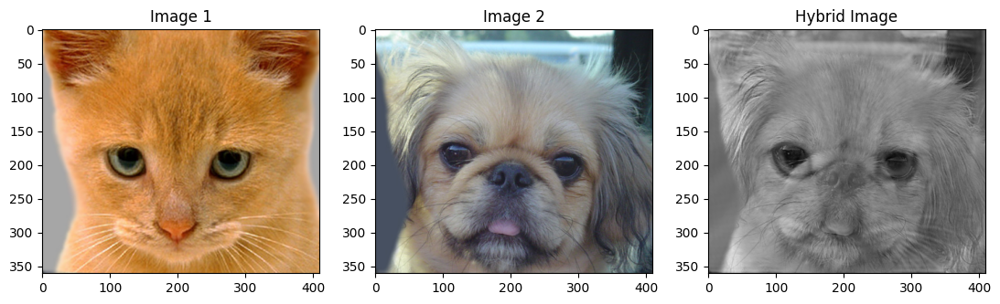

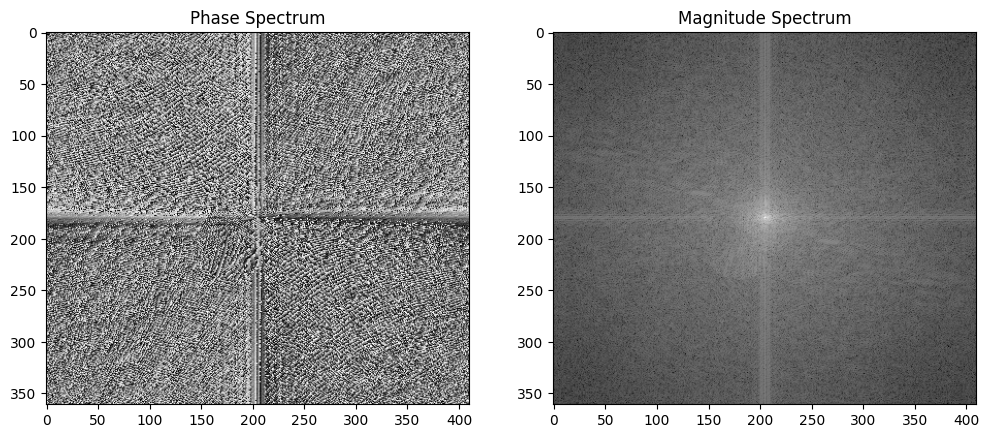

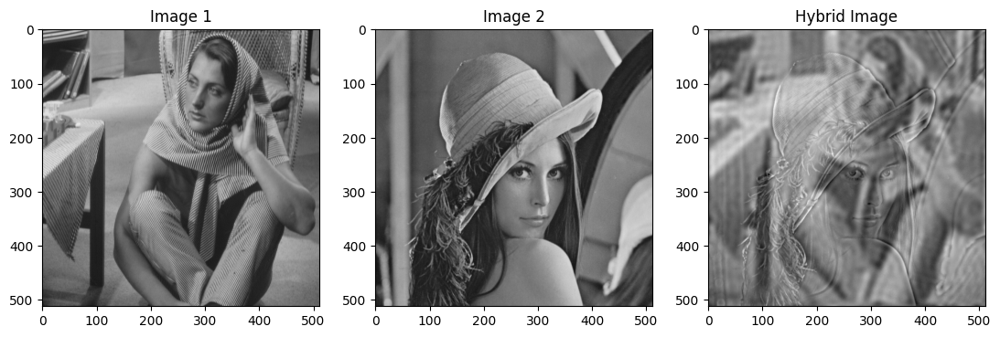

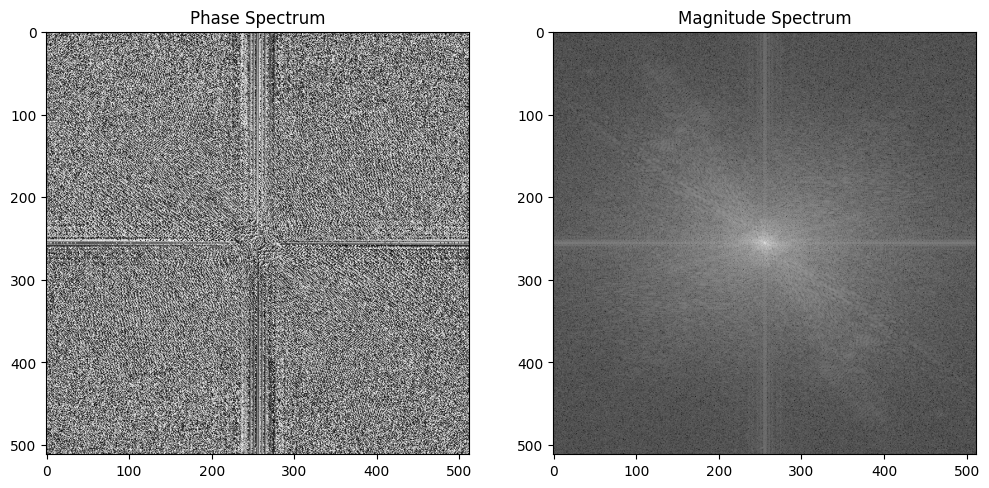

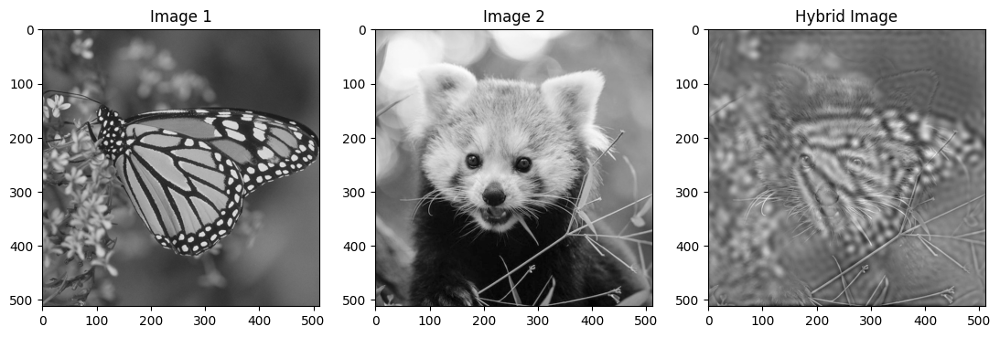

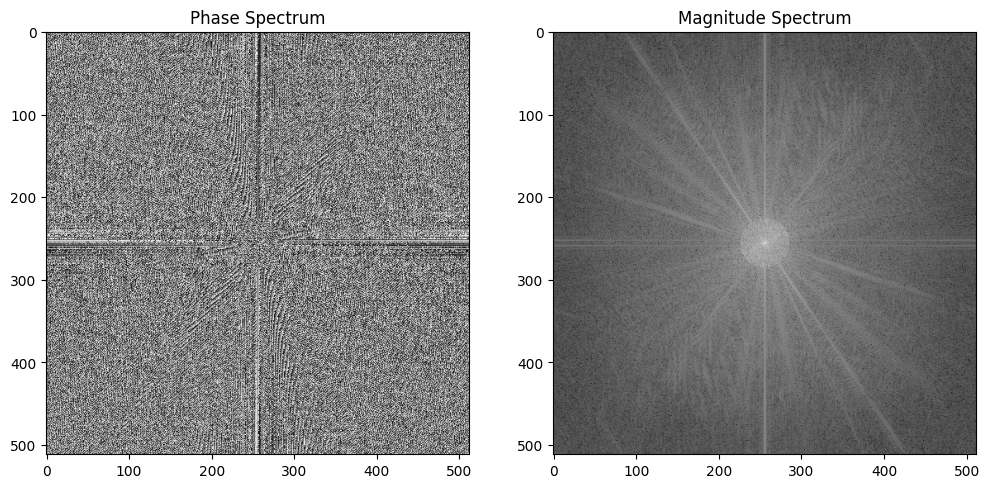

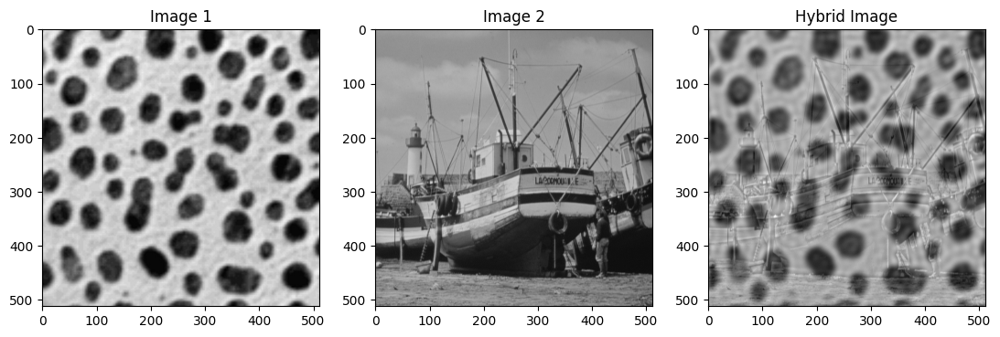

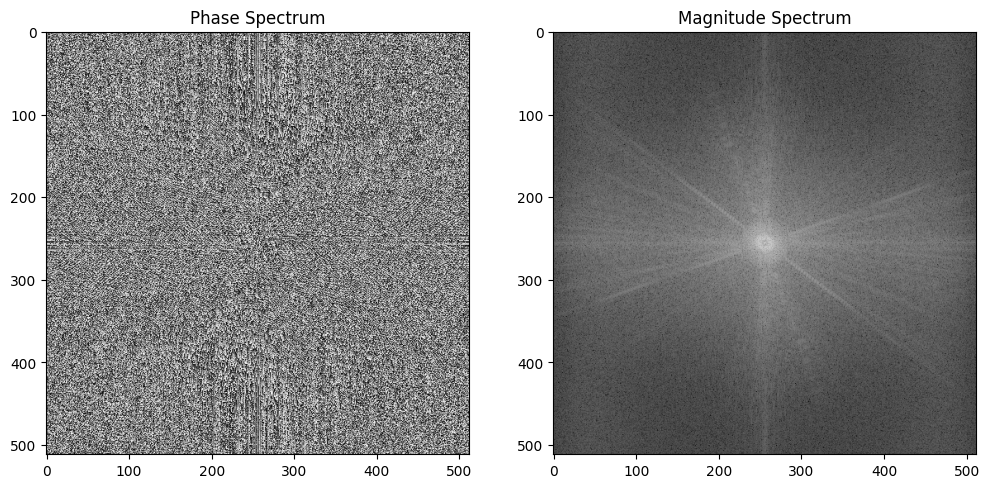

In [71]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def hybrid_images(image1, image2, cutoff_frequency):
    gray_image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    gray_image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

    f1 = np.fft.fft2(gray_image1)
    f2 = np.fft.fft2(gray_image2)

    f1_shifted = np.fft.fftshift(f1)
    f2_shifted = np.fft.fftshift(f2)

    rows, cols = gray_image1.shape

    mask = np.zeros((rows, cols), np.uint8)
    center = (rows // 2, cols // 2)
    cv2.circle(mask, center, cutoff_frequency, 1, -1)
    low_freq_component = f1_shifted * mask
    high_freq_component = f2_shifted * (1 - mask)
    hybrid_image_fft = low_freq_component + high_freq_component
    hybrid_image = np.fft.ifft2(np.fft.ifftshift(hybrid_image_fft)).real

    magnitude_spectrum = np.abs(hybrid_image_fft)
    phase_spectrum = np.angle(hybrid_image_fft)

    return hybrid_image, magnitude_spectrum, phase_spectrum

def display_hybrid(image_path1, image_path2, cutoff_frequency):
    image1 = cv2.imread(image_path1)
    image2 = cv2.imread(image_path2)
    hybrid_image, magnitude_spectrum, phase_spectrum = hybrid_images(image1, image2, cutoff_frequency)

    plt.figure(figsize=(18, 6))

    plt.subplot(1, 4, 1), plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)), plt.title('Image 1')
    plt.subplot(1, 4, 2), plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)), plt.title('Image 2')
    plt.subplot(1, 4, 3), plt.imshow(hybrid_image, cmap='gray'), plt.title('Hybrid Image')


    plt.show()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1), plt.imshow(phase_spectrum, cmap='gray'), plt.title('Phase Spectrum')
    plt.subplot(1, 2, 2), plt.imshow(np.log1p(magnitude_spectrum), cmap='gray'), plt.title('Magnitude Spectrum')

    plt.show()

image_path1 = '/content/cat.jpg'
image_path2 = '/content/dog.jpg'
cutoff_frequency = 35
display_hybrid(image_path1, image_path2, cutoff_frequency)

image_path1 = '/content/barbara.png'
image_path2 = '/content/lena.png'
cutoff_frequency = 30
display_hybrid(image_path1, image_path2, cutoff_frequency)

image_path1 = '/content/monarch.png'
image_path2 = '/content/panda.png'
cutoff_frequency = 30
display_hybrid(image_path1, image_path2, cutoff_frequency)

image_path1 = '/content/blobs.png'
image_path2 = '/content/boats.png'
cutoff_frequency = 30
display_hybrid(image_path1, image_path2, cutoff_frequency)


Q3)

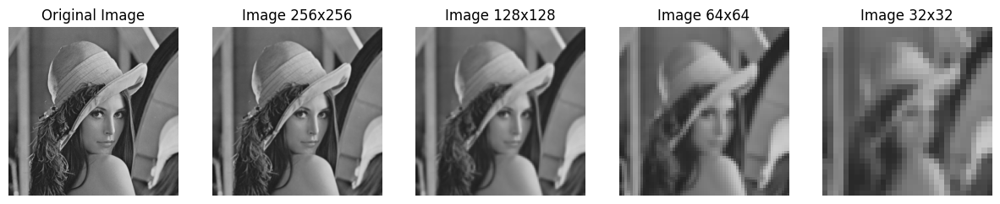

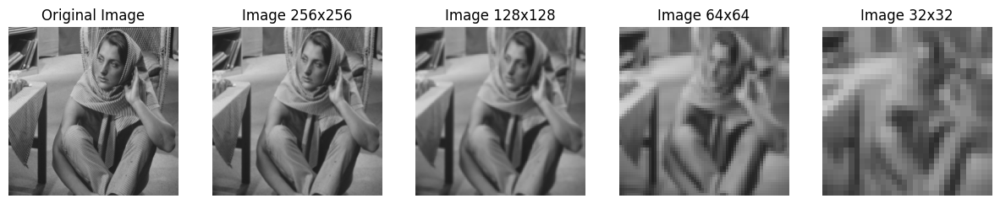

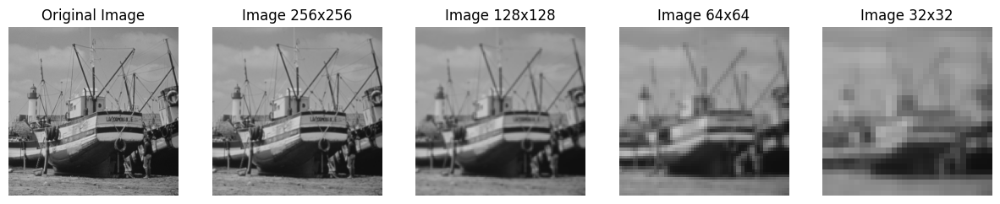

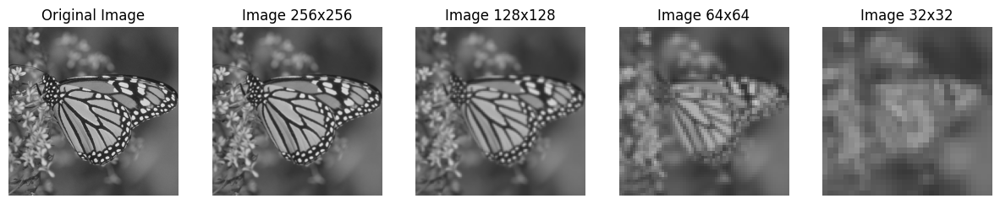

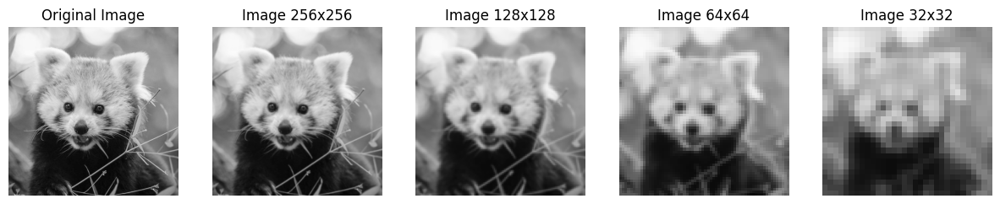

In [73]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def display_pyramid(images, titles):
    num_images = len(images)
    rows = 1
    cols = num_images

    plt.figure(figsize=(15, 5))

    for i in range(num_images):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        plt.title(titles[i])
        plt.axis('off')

    plt.show()

def func3(original_image):
  original_image_blurred = cv2.GaussianBlur(original_image, (5, 5), 0)
  image_256 = cv2.resize(original_image_blurred, (256, 256))

  image_256_blurred = cv2.GaussianBlur(image_256, (5, 5), 0)
  image_128 = cv2.resize(image_256_blurred, (128, 128))

  image_128_blurred = cv2.GaussianBlur(image_128, (5, 5), 0)
  image_64 = cv2.resize(image_128_blurred, (64, 64))

  image_64_blurred = cv2.GaussianBlur(image_64, (5, 5), 0)
  image_32 = cv2.resize(image_64_blurred, (32, 32))

  images = [original_image, image_256, image_128, image_64, image_32]
  titles = ['Original Image', 'Image 256x256', 'Image 128x128', 'Image 64x64', 'Image 32x32']

  display_pyramid(images, titles)

image1 = cv2.imread('/content/lena.png')
func3(image1)
image2 = cv2.imread('/content/barbara.png')
func3(image2)
image3 = cv2.imread('/content/boats.png')
func3(image3)
image4 = cv2.imread('/content/monarch.png')
func3(image4)
image5 = cv2.imread('/content/panda.png')
func3(image5)